# Deep Learning Course Project - Gesture Recognition

### *Contributors : Kumar Kanishka , Vibhuti Koldiya*

### Problem Statement
Imagine you are working as a data scientist at a home electronics company which manufactures state of the art smart televisions. You want to develop a cool feature in the smart-TV that can recognise five different gestures performed by the user which will help users control the TV without using a remote.

The gestures are continuously monitored by the webcam mounted on the TV. Each gesture corresponds to a specific command:
 
| Gesture | Corresponding Action |
| --- | --- | 
| Thumbs Up | Increase the volume. |
| Thumbs Down | Decrease the volume. |
| Left Swipe | 'Jump' backwards 10 seconds. |
| Right Swipe | 'Jump' forward 10 seconds. |
| Stop | Pause the movie. |

Each video is a sequence of 30 frames (or images).

### Objectives:
1. **Generator**:  The generator should be able to take a batch of videos as input without any error. Steps like cropping, resizing and normalization should be performed successfully.

2. **Model**: Develop a model that is able to train without any errors which will be judged on the total number of parameters (as the inference(prediction) time should be less) and the accuracy achieved. As suggested by Snehansu, start training on a small amount of data and then proceed further.

3. **Write up**: This should contain the detailed procedure followed in choosing the final model. The write up should start with the reason for choosing the base model, then highlight the reasons and metrics taken into consideration to modify and experiment to arrive at the final model. 

## Understanding the DataSet:

The training data consists of a few hundred videos categorised into one of the five classes. Each video (typically 2-3 seconds long) is divided into a sequence of 30 frames(images). These videos have been recorded by various people performing one of the five gestures in front of a webcam - similar to what the smart TV will use. 

### Let's visualise the sample data for one of the action "thumbs-down" for one video (image-sequence)

### The data has been placed in the folder "WIN_20180907_15_38_35_Pro_Thumbs Down_new" in current directory.



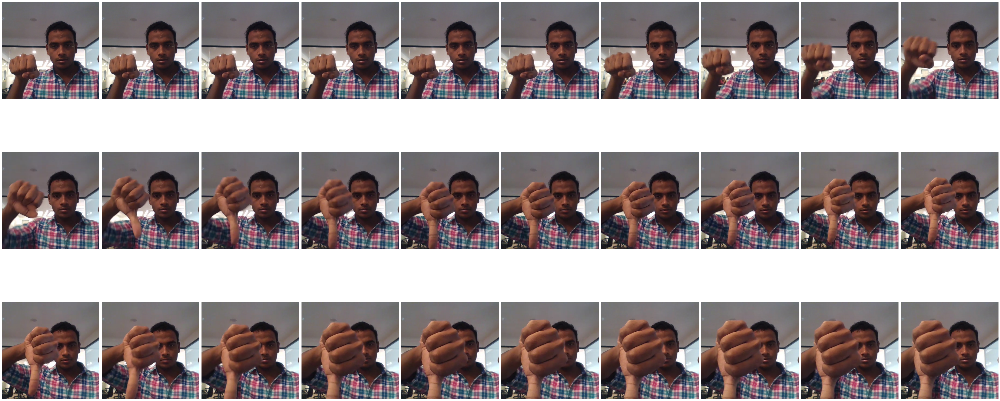

In [1]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
%matplotlib inline

# Read all images from the specified folder
images = []
for img_path in glob.glob(r'C:\Users\Sc0uRJaX\Downloads\Project_data\train\WIN_20180907_15_38_35_Pro_Thumbs Down_new\*.png'):
    images.append(mpimg.imread(img_path))

# Set figure size and number of columns
plt.figure(figsize=(60, 30))
columns = 10

# Calculate the number of rows required (ensure it's an integer)
rows = math.ceil(len(images) / columns)

# Plot images in a grid
for i, image in enumerate(images):
    plt.subplot(rows, columns, i + 1)
    plt.imshow(image)
    plt.axis('off')  # Hide axes for better display

# Show the plot
plt.tight_layout()
plt.show()


### Importing the python basic libraries and functions:

In [2]:
import numpy as np
import os
import datetime
import matplotlib.pyplot as plt
%matplotlib inline
import cv2 #opencv library
import tensorflow as tf
from keras import backend as K
import random as rn
# Importing additional libraries which might be needed for image pre-processing :

#import resize as imresize
#import sckikit-image as skimage
import imageio as imio
from PIL import Image

### Doing the required Keras imports

In [3]:
from keras.models import Sequential
from keras.layers import Dense, GRU, Flatten, TimeDistributed, BatchNormalization, Activation, Dropout, Dense
from keras.layers import Conv2D, Conv3D, MaxPooling2D, MaxPooling3D, ZeroPadding3D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam, SGD
from keras.losses import categorical_crossentropy

### Setting Random seed

In [4]:
np.random.seed(40)
rn.seed(40)
tf.random.set_seed(40)

In [5]:
# Check the Tensor flow version :
tf.__version__

'2.17.0'

In [6]:
# Checking the openCV version 
cv2.__version__

'4.10.0'

In [7]:
# Ensure TensorFlow uses GPU memory efficiently
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only allocate memory as needed
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)


In this block, you read the folder names for training and validation. You also set the `batch_size` here. Note that you set the batch size in such a way that you are able to use the GPU in full capacity. You keep increasing the batch size until the machine throws an error.

In [8]:
train_doc = np.random.permutation(open(r'C:\Users\Sc0uRJaX\Downloads\Project_data\train.csv').readlines())
val_doc = np.random.permutation(open(r'C:\Users\Sc0uRJaX\Downloads\Project_data\val.csv').readlines())

#experiment with the batch size
batch_size = 20

In [9]:
# Custom function to crop image :

def crop_img(img, scale=1.0):
    center_x, center_y = img.shape[1] / 2, img.shape[0] / 2
    width_scaled, height_scaled = img.shape[1] * scale, img.shape[0] * scale
    left_x, right_x = center_x - width_scaled / 2, center_x + width_scaled / 2
    top_y, bottom_y = center_y - height_scaled / 2, center_y + height_scaled / 2
    img_cropped = img[int(top_y):int(bottom_y), int(left_x):int(right_x)]
    return img_cropped

## Generator
This is one of the most important part of the code. The overall structure of the generator has been given. In the generator, you are going to preprocess the images as you have images of 2 different dimensions as well as create a batch of video frames. 

In [10]:
def generator(source_path, folder_list, batch_size):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    
    #create a list of image numbers you want to use for a particular video
    img_idx = [0,1,2,4,6,8,10,12,14,16,18,20,22,24,26,27,28,29]
    #list(range(0,29,2))
    
    while True:
        t = np.random.permutation(folder_list)
        
# calculate the number of batches
        num_batches = int(len(t)/batch_size)
        
# we iterate over the number of batches
        for batch in range(num_batches): 
            
# x is the number of images you use for each video, (y,z) is the final size of the input images and 3 is the number of channels RGB          
            batch_data = np.zeros((batch_size,18,64,64,3))
# batch_labels is the one hot representation of the output
            batch_labels = np.zeros((batch_size,5))

# iterate over the batch_size    
            for folder in range(batch_size): 
# read all the images in the folder        
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) 
#  Iterate over the frames/images of a folder to read them in    
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    
#crop the images and resize them. Note that the images are of 2 different shape 
#and the conv3D will throw error if the inputs in a batch have different shapes

# Cropping image by 10 % of original size :
                    image = crop_img(image, 0.10)
    
# Resizing the image :    
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(64,64),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(64,64),interpolation = cv2.INTER_AREA).astype(np.float32)                    
                        
#normalise and feed in the image

                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
#you yield the batch_data and the batch_labels, remember what does yield do                
            yield batch_data, batch_labels 

        
# write the code for the remaining data points which are left after full batches
        if (len(t)%batch_size) != 0:
            batch_data = np.zeros((len(t)%batch_size,18,64,64,3))
            batch_labels = np.zeros((len(t)%batch_size,5))
            for folder in range(len(t)%batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (num_batches*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (num_batches*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    
# Cropping image by 10 % of original size :
                    image = crop_img(image, 0.10)

# Resizing the image :
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(64,64),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(64,64),interpolation = cv2.INTER_AREA).astype(np.float32)

# Perform normalization on images
                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255

                batch_labels[folder, int(t[folder + (num_batches*batch_size)].strip().split(';')[2])] = 1

            yield batch_data, batch_labels


Note here that a video is represented above in the generator as (number of images, height, width, number of channels). Take this into consideration while creating the model architecture.

In [11]:
curr_dt_time = datetime.datetime.now()
train_path = r'C:\Users\Sc0uRJaX\Downloads\Project_data\train'
val_path = r'C:\Users\Sc0uRJaX\Downloads\Project_data\val'
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
# choose the number of epochs
num_epochs = 5
print ('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 5


## Model--

Here you create the model using Keras functionalities. Use `Conv3D` and `MaxPooling3D` for 3D convolutional layers, and avoid `Conv2D` and `MaxPooling2D`. For models that incorporate RNNs, use `TimeDistributed` in combination with `Conv2D` layers. Ensure that the final layer is a `softmax` layer. Design the network to achieve high accuracy with the fewest number of parameters to ensure it fits within the memory constraints of a webc

---

# First Base Model : Conv 3D Model with 5 epochs, 25 batch size 
### Without dropouts in Conv layer and with batch normalization

### Input image size 64X64 , adam optimiser with learning rate 0.0003 with decay, 18 images as input out of 30 

In [12]:
# Building the first model which is 3D Conv model:

modelConv3D_1 = Sequential()

modelConv3D_1.add(Conv3D(8, (3,3,3), padding='same', input_shape=(18,64,64,3)))
modelConv3D_1.add(Activation('relu'))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(MaxPooling3D(pool_size=(2,2,2)))

# Uncomment the following line if you want to include Dropout
# modelConv3D_1.add(Dropout(0.25))

modelConv3D_1.add(Conv3D(16, (3,3,3), padding='same'))
modelConv3D_1.add(Activation('relu'))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(MaxPooling3D(pool_size=(2,2,2)))

# Uncomment the following line if you want to include Dropout
# modelConv3D_1.add(Dropout(0.25))

modelConv3D_1.add(Conv3D(32, (3,3,3), padding='same'))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(Activation('relu'))
modelConv3D_1.add(MaxPooling3D(pool_size=(2,2,2)))

# Uncomment the following line if you want to include Dropout
# modelConv3D_1.add(Dropout(0.25))

modelConv3D_1.add(Conv3D(64, (3,3,3), padding='same'))
modelConv3D_1.add(Activation('relu'))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(MaxPooling3D(pool_size=(2,2,2)))

# Uncomment the following line if you want to include Dropout
# modelConv3D_1.add(Dropout(0.25))

modelConv3D_1.add(Flatten())
modelConv3D_1.add(Dense(64, activation='relu'))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(Dropout(0.25))

modelConv3D_1.add(Dense(64, activation='relu'))
modelConv3D_1.add(BatchNormalization())
modelConv3D_1.add(Dropout(0.25))

modelConv3D_1.add(Dense(5, activation='softmax'))

# Update optimizer to the latest API
optimiser = Adam(learning_rate=0.0003, decay=1e-6)

# Compile model
modelConv3D_1.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
print(modelConv3D_1.summary())



C:\Users\Sc0uRJaX\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
C:\Users\Sc0uRJaX\anaconda3\Lib\site-packages\keras\src\optimizers\base_optimizer.py:33: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv3d (Conv3D)                      │ (None, 18, 64, 64, 8)       │             656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 18, 64, 64, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 18, 64, 64, 8)       │              32 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d (MaxPooling3D)         │ (None, 9, 32, 32, 8)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_1 (Conv3D)                    │ (None, 9, 32, 32, 16)       │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 9, 32, 32, 16)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 9, 32, 32, 16)       │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_1 (MaxPooling3D)       │ (None, 4, 16, 16, 16)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_2 (Conv3D)                    │ (None, 4, 16, 16, 32)       │          13,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 4, 16, 16, 32)       │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 4, 16, 16, 32)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_2 (MaxPooling3D)       │ (None, 2, 8, 8, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_3 (Conv3D)                    │ (None, 2, 8, 8, 64)         │          55,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 2, 8, 8, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 2, 8, 8, 64)         │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_3 (MaxPooling3D)       │ (None, 1, 4, 4, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │          65,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │              

 Total params: 144,421 (564.14 KB)

 Trainable params: 143,925 (562.21 KB)

 Non-trainable params: 496 (1.94 KB)

None


In [13]:
print("Total Params in model:", modelConv3D_1.count_params())

Total Params in model: 144421


Once you have defined the model, the next step is to compile it. After compiling, you can print the model summary to view the total number of parameters that need to be trained.

In [14]:
#write your optimizer
#optimiser = 
#sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.7, nesterov=True)
#model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
#print (model.summary())

Let us create the `train_generator` and the `val_generator` which will be used in `.fit_generator`.

In [15]:
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

In [16]:
# Define the directory where the model checkpoints will be saved
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'

# Create the directory if it does not exist
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
# Define the file path for saving model checkpoints
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Setup ModelCheckpoint to save the model
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto')

# Setup ReduceLROnPlateau to reduce learning rate on plateaus
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)

# Combine callbacks into a list
callbacks_list = [checkpoint, LR]


The `steps_per_epoch` and `validation_steps` are used by `fit_generator` to decide the number of next() calls it need to make.

In [17]:
if (num_train_sequences%batch_size) == 0:
    steps_per_epoch = int(num_train_sequences/batch_size)
else:
    steps_per_epoch = (num_train_sequences//batch_size) + 1

if (num_val_sequences%batch_size) == 0:
    validation_steps = int(num_val_sequences/batch_size)
else:
    validation_steps = (num_val_sequences//batch_size) + 1

Let us now fit the model. This will start training the model and with the help of the checkpoints, you'll be able to save the model at the end of each epoch.

In [18]:
# Train the model using fit with generators and multiprocessing to improve training time
history = modelConv3D_1.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)

Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\train ; batch size = 20
Epoch 1/5
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 611ms/step - categorical_accuracy: 0.2514 - loss: 2.0918Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\val ; batch size = 20

Epoch 1: saving model to model_init_2024-09-1221_58_44.264321/model-00001-1.97776-0.28658-1.61822-0.23000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 27s 702ms/step - categorical_accuracy: 0.2534 - loss: 2.0853 - val_categorical_accuracy: 0.2300 - val_loss: 1.6182 - learning_rate: 3.0000e-04
Epoch 2/5
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 537ms/step - categorical_accuracy: 0.3401 - loss: 1.7885
Epoch 2: saving model to model_init_2024-09-1221_58_44.264321/model-00002-1.75350-0.34389-1.65708-0.17000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 19s 575ms/step - categorical_accuracy: 0.3404 - loss: 1.7865 - val_categorical_accuracy: 0.1700 - val_loss: 1.6571 - learning_rate: 3.0000e-04
Epoch 3/5
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 517ms/step - categorical_accuracy: 0.3794 - 

In [19]:
# Defining a function so that the we can plot the summary charts using a single line of code

def plot_training_history(history):
    """
    Plots the training and validation accuracy and loss from the training history.

    Parameters:
    history (History): The History object returned from the `fit` method of a Keras model.
    """
    # Plot training & validation accuracy
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['categorical_accuracy'])
    plt.plot(history.history['val_categorical_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    
    # Plot training & validation loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    
    plt.show()


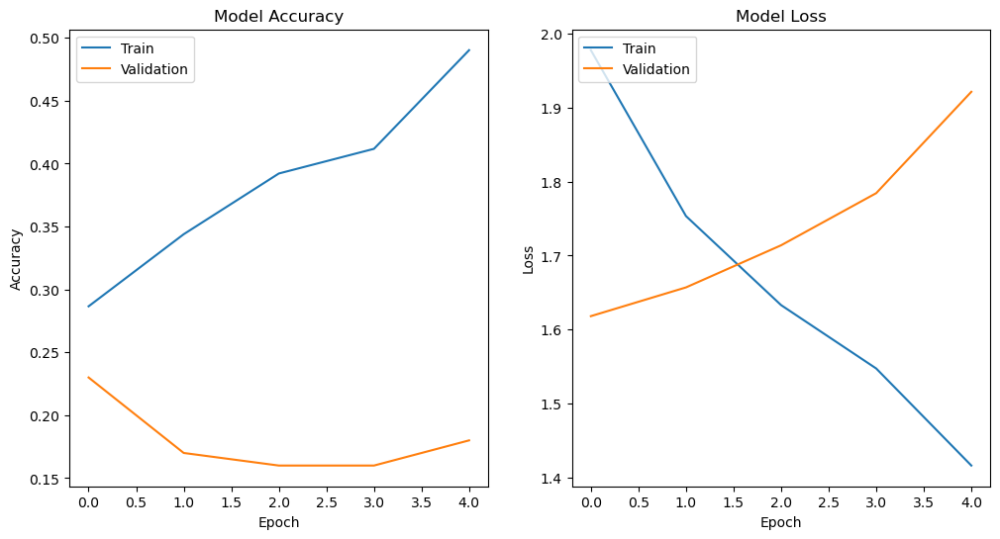

In [20]:
plot_training_history(history)

So we have got the training accuarcy of 48.90 % and validation accuracy of 18 % in the base model

# Second Model  : Conv 3D Model with 20 epochs, 30 batch size 
Without dropouts in Conv layer and with batch normalization.
Input image size 64X64 , adam optimiser with learning rate 0.0003 without decay, 18 images as input out of 30
Changed droput to 0.50 from 0.25 in 1st dense layer 

In [21]:
batch_size = 30
num_epochs = 20

In [22]:
# Building the second model which is 3D Conv model:

modelConv3D_2 = Sequential()

modelConv3D_2.add(Conv3D(8, (3,3,3), padding='same', input_shape=(18,64,64,3)))
modelConv3D_2.add(Activation('relu'))
modelConv3D_2.add(BatchNormalization())
modelConv3D_2.add(MaxPooling3D(pool_size=(2,2,2)))

#modelConv3D_2.add(Dropout(0.25))

modelConv3D_2.add(Conv3D(16, (3,3,3), padding='same'))
modelConv3D_2.add(Activation('relu'))
modelConv3D_2.add(BatchNormalization())
modelConv3D_2.add(MaxPooling3D(pool_size=(2,2,2)))

#modelConv3D_2.add(Dropout(0.25))

modelConv3D_2.add(Conv3D(32, (3,3,3), padding='same'))
modelConv3D_2.add(BatchNormalization())
modelConv3D_2.add(Activation('relu'))
modelConv3D_2.add(MaxPooling3D(pool_size=(2,2,2)))

#modelConv3D_2.add(Dropout(0.25))

modelConv3D_2.add(Conv3D(64, (3,3,3), padding='same'))
modelConv3D_2.add(Activation('relu'))
modelConv3D_2.add(BatchNormalization())
modelConv3D_2.add(MaxPooling3D(pool_size=(2,2,2)))

#modelConv3D_2.add(Dropout(0.25))

modelConv3D_2.add(Flatten())
modelConv3D_2.add(Dense(64, activation='relu'))
modelConv3D_2.add(BatchNormalization())
modelConv3D_2.add(Dropout(0.50))

modelConv3D_2.add(Dense(64, activation='relu'))
modelConv3D_2.add(BatchNormalization())
modelConv3D_2.add(Dropout(0.25))

modelConv3D_2.add(Dense(5, activation='softmax'))

# Update optimizer to the latest API
optimiser = Adam(learning_rate=0.0003)

# Compile model
modelConv3D_2.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
print(modelConv3D_2.summary())


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv3d_4 (Conv3D)                    │ (None, 18, 64, 64, 8)       │             656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 18, 64, 64, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 18, 64, 64, 8)       │              32 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_4 (MaxPooling3D)       │ (None, 9, 32, 32, 8)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_5 (Conv3D)                    │ (None, 9, 32, 32, 16)       │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_5 (Activation)            │ (None, 9, 32, 32, 16)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 9, 32, 32, 16)       │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_5 (MaxPooling3D)       │ (None, 4, 16, 16, 16)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_6 (Conv3D)                    │ (None, 4, 16, 16, 32)       │          13,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 4, 16, 16, 32)       │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_6 (Activation)            │ (None, 4, 16, 16, 32)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_6 (MaxPooling3D)       │ (None, 2, 8, 8, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_7 (Conv3D)                    │ (None, 2, 8, 8, 64)         │          55,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_7 (Activation)            │ (None, 2, 8, 8, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 2, 8, 8, 64)         │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_7 (MaxPooling3D)       │ (None, 1, 4, 4, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │          65,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │              

 Total params: 144,421 (564.14 KB)

 Trainable params: 143,925 (562.21 KB)

 Non-trainable params: 496 (1.94 KB)

None


In [23]:
print("Total Params in model:", modelConv3D_2.count_params())

Total Params in model: 144421


In [24]:
# Define the directory where the model checkpoints will be saved
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'

# Create the directory if it does not exist
if not os.path.exists(model_name):
    os.mkdir(model_name)
        
# Define the file path for saving model checkpoints
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Setup ModelCheckpoint to save the model
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto')

# Setup ReduceLROnPlateau to reduce learning rate on plateaus
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4, verbose=1)

# Combine callbacks into a list
callbacks_list = [checkpoint, LR]


In [25]:
# Train the model using fit with generators and multiprocessing to improve training time
history = modelConv3D_2.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)

Epoch 1/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 577ms/step - categorical_accuracy: 0.2322 - loss: 2.2825
Epoch 1: saving model to model_init_2024-09-1221_58_44.264321/model-00001-2.20889-0.23982-1.66182-0.16000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 25s 668ms/step - categorical_accuracy: 0.2324 - loss: 2.2804 - val_categorical_accuracy: 0.1600 - val_loss: 1.6618 - learning_rate: 3.0000e-04
Epoch 2/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 512ms/step - categorical_accuracy: 0.3162 - loss: 1.8262
Epoch 2: saving model to model_init_2024-09-1221_58_44.264321/model-00002-1.83768-0.31674-1.80258-0.16000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 19s 564ms/step - categorical_accuracy: 0.3162 - loss: 1.8265 - val_categorical_accuracy: 0.1600 - val_loss: 1.8026 - learning_rate: 3.0000e-04
Epoch 3/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 501ms/step - categorical_accuracy: 0.3407 - loss: 1.8580
Epoch 3: saving model to model_init_2024-09-1221_58_44.264321/model-00003-1.82550-0.33183-1.76590-0.19000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 17s

In [26]:
print("Total Params in model:", modelConv3D_2.count_params())

Total Params in model: 144421


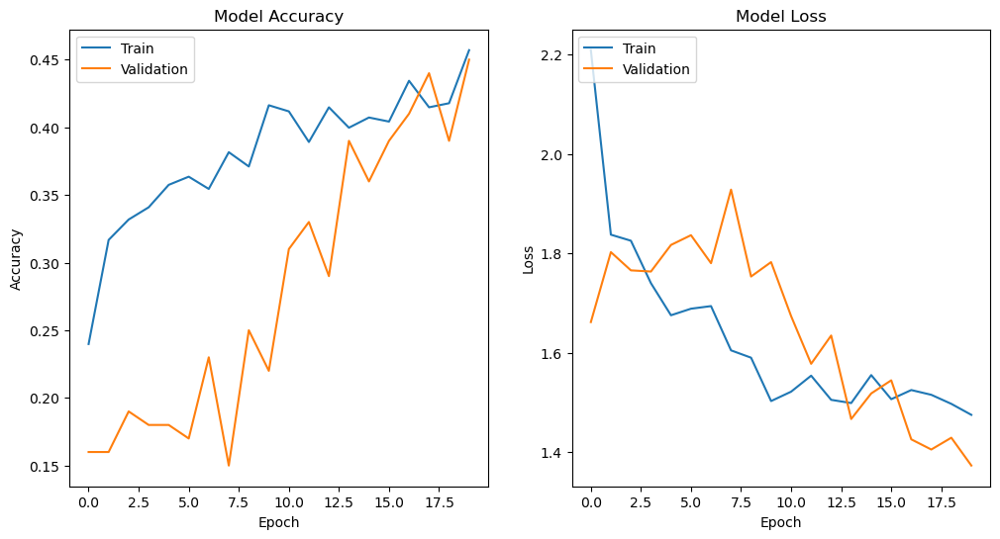

In [27]:
# Plotting the result of Model 2 :

plot_training_history(history)

So we have got the training accuarcy of 43.31 % and validation accuracy of 45 % in the second model

# Third Model  : Conv 3D Model with 20 epochs and 30 batch size , image size increased to 84X84, reduced cropping to 3 % from 10 %
Without dropouts in Conv layer and with batch normalization.
adam optimiser with learning rate 0.0003 without decay, 18 images as input out of 30
Reverted back dropout from 0.50 to 0.25 in 1st dense layer 

In [28]:
# Modified generator function :

def generator_modified(source_path, folder_list, batch_size):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    
    #create a list of image numbers you want to use for a particular video
    img_idx = [1,2,4,6,7,8,10,12,14,16,18,20,21,22,24,26,27,29]
    #list(range(0,29,2))
    
    while True:
        t = np.random.permutation(folder_list)
        
# calculate the number of batches
        num_batches = int(len(t)/batch_size)
        
# we iterate over the number of batches
        for batch in range(num_batches): 
            
# x is the number of images you use for each video, (y,z) is the final size of the input images and 3 is the number of channels RGB          
            batch_data = np.zeros((batch_size,18,84,84,3))
# batch_labels is the one hot representation of the output
            batch_labels = np.zeros((batch_size,5))

# iterate over the batch_size    
            for folder in range(batch_size): 
# read all the images in the folder        
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) 
#  Iterate over the frames/images of a folder to read them in    
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    
#crop the images and resize them. Note that the images are of 2 different shape 
#and the conv3D will throw error if the inputs in a batch have different shapes

# Cropping image by 3 % of original size :
                    image = crop_img(image, 0.03)
    
# Resizing the image :    
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(84,84),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(84,84),interpolation = cv2.INTER_AREA).astype(np.float32)                    
                        
#normalise and feed in the image

                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
#you yield the batch_data and the batch_labels, remember what does yield do                
            yield batch_data, batch_labels 

        
# write the code for the remaining data points which are left after full batches
        if (len(t)%batch_size) != 0:
            batch_data = np.zeros((len(t)%batch_size,18,84,84,3))
            batch_labels = np.zeros((len(t)%batch_size,5))
            for folder in range(len(t)%batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (num_batches*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (num_batches*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    
# Cropping image by 3 % of original size :
                    image = crop_img(image, 0.03)

# Resizing the image :
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(84,84),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(84,84),interpolation = cv2.INTER_AREA).astype(np.float32)

# Perform normalization on images
                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255

                batch_labels[folder, int(t[folder + (num_batches*batch_size)].strip().split(';')[2])] = 1

            yield batch_data, batch_labels


In [29]:
curr_dt_time = datetime.datetime.now()
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
# choose the number of epochs
num_epochs = 20
print ('# epochs =', num_epochs)

batch_size = 30
print ('# batch_size =', batch_size)

# training sequences = 663
# validation sequences = 100
# epochs = 20
# batch_size = 30


In [30]:
# Building the 3rd model which is a 3D Conv model

modelConv3D_3 = Sequential()

# First 3D Conv layer
modelConv3D_3.add(Conv3D(8, (3,3,3), padding='same', input_shape=(18,84,84,3)))
modelConv3D_3.add(Activation('relu'))
modelConv3D_3.add(BatchNormalization())
modelConv3D_3.add(MaxPooling3D(pool_size=(2,2,2)))

# Second 3D Conv layer
modelConv3D_3.add(Conv3D(16, (3,3,3), padding='same'))
modelConv3D_3.add(Activation('relu'))
modelConv3D_3.add(BatchNormalization())
modelConv3D_3.add(MaxPooling3D(pool_size=(2,2,2)))

# Third 3D Conv layer
modelConv3D_3.add(Conv3D(32, (3,3,3), padding='same'))
modelConv3D_3.add(BatchNormalization())
modelConv3D_3.add(Activation('relu'))
modelConv3D_3.add(MaxPooling3D(pool_size=(2,2,2)))

# Fourth 3D Conv layer
modelConv3D_3.add(Conv3D(64, (3,3,3), padding='same'))
modelConv3D_3.add(Activation('relu'))
modelConv3D_3.add(BatchNormalization())
modelConv3D_3.add(MaxPooling3D(pool_size=(2,2,2)))

# Flatten the output before Dense layers
modelConv3D_3.add(Flatten())

# First Dense layer
modelConv3D_3.add(Dense(128, activation='relu'))
modelConv3D_3.add(BatchNormalization())
modelConv3D_3.add(Dropout(0.25))

# Second Dense layer
modelConv3D_3.add(Dense(64, activation='relu'))
modelConv3D_3.add(BatchNormalization())
modelConv3D_3.add(Dropout(0.25))

# Output layer with softmax for 5 categories
modelConv3D_3.add(Dense(5, activation='softmax'))

# Update optimizer to the latest API
optimiser = Adam(learning_rate=0.0003)

# Compile model
modelConv3D_3.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
print(modelConv3D_3.summary())


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv3d_8 (Conv3D)                    │ (None, 18, 84, 84, 8)       │             656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_8 (Activation)            │ (None, 18, 84, 84, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 18, 84, 84, 8)       │              32 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_8 (MaxPooling3D)       │ (None, 9, 42, 42, 8)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_9 (Conv3D)                    │ (None, 9, 42, 42, 16)       │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_9 (Activation)            │ (None, 9, 42, 42, 16)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 9, 42, 42, 16)       │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_9 (MaxPooling3D)       │ (None, 4, 21, 21, 16)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_10 (Conv3D)                   │ (None, 4, 21, 21, 32)       │          13,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 4, 21, 21, 32)       │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_10 (Activation)           │ (None, 4, 21, 21, 32)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_10 (MaxPooling3D)      │ (None, 2, 10, 10, 32)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_11 (Conv3D)                   │ (None, 2, 10, 10, 64)       │          55,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_11 (Activation)           │ (None, 2, 10, 10, 64)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 2, 10, 10, 64)       │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_11 (MaxPooling3D)      │ (None, 1, 5, 5, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 1600)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │              

 Total params: 288,101 (1.10 MB)

 Trainable params: 287,477 (1.10 MB)

 Non-trainable params: 624 (2.44 KB)

None


In [31]:
print("Total Params in model:", modelConv3D_3.count_params())

Total Params in model: 288101


In [32]:
# Create generators for training and validation data
train_generator = generator_modified(train_path, train_doc, batch_size)
val_generator = generator_modified(val_path, val_doc, batch_size)

# Define the directory where the model checkpoints will be saved
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ', '').replace(':', '_') + '/'

# Create the directory if it does not exist
if not os.path.exists(model_name):
    os.mkdir(model_name)

# Define the file path for saving model checkpoints
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Setup ModelCheckpoint to save the model
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto')

# Setup ReduceLROnPlateau to reduce learning rate on plateaus
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, verbose=1)

# Combine callbacks into a list
callbacks_list = [checkpoint, LR]

# Calculate steps per epoch for training and validation
steps_per_epoch = (num_train_sequences + batch_size - 1) // batch_size
validation_steps = (num_val_sequences + batch_size - 1) // batch_size


In [33]:
# Train the model using fit with generators and multiprocessing to improve training time
history = modelConv3D_3.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)

Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\train ; batch size = 30
Epoch 1/20
22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 948ms/step - categorical_accuracy: 0.2455 - loss: 2.2546Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\val ; batch size = 30

Epoch 1: saving model to model_init_2024-09-1222_06_39.470699/model-00001-2.12592-0.26094-1.62987-0.16000.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - categorical_accuracy: 0.2468 - loss: 2.2439 - val_categorical_accuracy: 0.1600 - val_loss: 1.6299 - learning_rate: 3.0000e-04
Epoch 2/20
22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 904ms/step - categorical_accuracy: 0.3091 - loss: 1.8685
Epoch 2: saving model to model_init_2024-09-1222_06_39.470699/model-00002-1.87892-0.30468-1.67850-0.16000.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 21s 920ms/step - categorical_accuracy: 0.3087 - loss: 1.8693 - val_categorical_accuracy: 0.1600 - val_loss: 1.6785 - learning_rate: 3.0000e-04
Epoch 3/20
22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 910ms/step - categorical_accuracy: 0.3824 - 

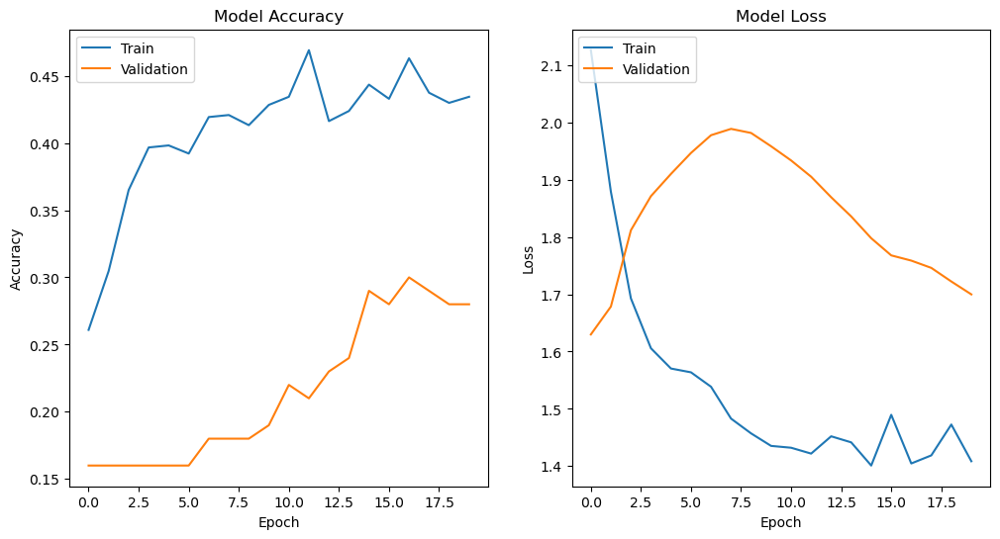

In [34]:
# Plotting the result of Model 3 :

plot_training_history(history)

So we have got the training accuarcy of 42.21 % and validation accuracy of 28 % in the third model

# Fourth Model : Conv 3D model 
## batch size 50, epoch 30

In [35]:
train_doc = np.random.permutation(open(r'C:\Users\Sc0uRJaX\Downloads\Project_data\train.csv').readlines())
val_doc = np.random.permutation(open(r'C:\Users\Sc0uRJaX\Downloads\Project_data\val.csv').readlines())

In [36]:
def generator(source_path, folder_list, batch_size):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    
    #create a list of image numbers you want to use for a particular video
    img_idx = [1,2,4,6,7,8,10,12,14,16,18,20,21,22,24,26,27,29]
    #list(range(0,29,2))
    
    while True:
        t = np.random.permutation(folder_list)
        
# calculate the number of batches
        num_batches = int(len(t)/batch_size)
        
# we iterate over the number of batches
        for batch in range(num_batches): 
            
# x is the number of images you use for each video, (y,z) is the final size of the input images and 3 is the number of channels RGB          
            batch_data = np.zeros((batch_size,18,100,100,3))
# batch_labels is the one hot representation of the output
            batch_labels = np.zeros((batch_size,5))

# iterate over the batch_size    
            for folder in range(batch_size): 
# read all the images in the folder        
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) 
#  Iterate over the frames/images of a folder to read them in    
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    
#crop the images and resize them. Note that the images are of 2 different shape 
#and the conv3D will throw error if the inputs in a batch have different shapes

# Cropping image by 10 % of original size :
                    image = crop_img(image, 0.02)
    
# Resizing the image :    
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(100,100),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(100,100),interpolation = cv2.INTER_AREA).astype(np.float32)                    
                        
#normalise and feed in the image

                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
#you yield the batch_data and the batch_labels, remember what does yield do                
            yield batch_data, batch_labels 

        
# write the code for the remaining data points which are left after full batches
        if (len(t)%batch_size) != 0:
            batch_data = np.zeros((len(t)%batch_size,18,100,100,3))
            batch_labels = np.zeros((len(t)%batch_size,5))
            for folder in range(len(t)%batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (num_batches*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (num_batches*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    
# Cropping image by 10 % of original size :
                    image = crop_img(image, 0.02)

# Resizing the image :
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(100,100),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(100,100),interpolation = cv2.INTER_AREA).astype(np.float32)

# Perform normalization on images
                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255

                batch_labels[folder, int(t[folder + (num_batches*batch_size)].strip().split(';')[2])] = 1

            yield batch_data, batch_labels


In [37]:
# Building the updated model
modelConv3D_4 = Sequential()

modelConv3D_4.add(Conv3D(8, kernel_size=(3,3,3), padding='same', input_shape=(18, 84, 84, 3)))
modelConv3D_4.add(BatchNormalization())
modelConv3D_4.add(Activation('relu'))
modelConv3D_4.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D_4.add(Conv3D(16, kernel_size=(3,3,3), padding='same'))
modelConv3D_4.add(BatchNormalization())
modelConv3D_4.add(Activation('relu'))
modelConv3D_4.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D_4.add(Conv3D(32, kernel_size=(1,3,3), padding='same'))
modelConv3D_4.add(BatchNormalization())
modelConv3D_4.add(Activation('relu'))
modelConv3D_4.add(MaxPooling3D(pool_size=(2,2,2)))

modelConv3D_4.add(Conv3D(64, kernel_size=(1,3,3), padding='same'))
modelConv3D_4.add(Activation('relu'))
modelConv3D_4.add(Dropout(0.25))
modelConv3D_4.add(MaxPooling3D(pool_size=(2,2,2)))

# Flatten the output to prepare for Dense layers
modelConv3D_4.add(Flatten())

# Add a Dense layer with units based on the flattened output shape
modelConv3D_4.add(Dense(1600, activation='relu'))  # Adjust units to match the actual flattened output
modelConv3D_4.add(Dropout(0.25))

modelConv3D_4.add(Dense(128, activation='relu'))
modelConv3D_4.add(Dropout(0.25))

# Softmax layer for classification
modelConv3D_4.add(Dense(5, activation='softmax'))

# Compile the model with the Adam optimizer
optimiser = Adam(learning_rate=0.0003)
modelConv3D_4.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary to check layer shapes
print(modelConv3D_4.summary())

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv3d_12 (Conv3D)                   │ (None, 18, 84, 84, 8)       │             656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_18               │ (None, 18, 84, 84, 8)       │              32 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_12 (Activation)           │ (None, 18, 84, 84, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_12 (MaxPooling3D)      │ (None, 9, 42, 42, 8)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_13 (Conv3D)                   │ (None, 9, 42, 42, 16)       │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_19               │ (None, 9, 42, 42, 16)       │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_13 (Activation)           │ (None, 9, 42, 42, 16)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_13 (MaxPooling3D)      │ (None, 4, 21, 21, 16)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_14 (Conv3D)                   │ (None, 4, 21, 21, 32)       │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 4, 21, 21, 32)       │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_14 (Activation)           │ (None, 4, 21, 21, 32)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_14 (MaxPooling3D)      │ (None, 2, 10, 10, 32)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_15 (Conv3D)                   │ (None, 2, 10, 10, 64)       │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_15 (Activation)           │ (None, 2, 10, 10, 64)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 2, 10, 10, 64)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_15 (MaxPooling3D)      │ (None, 1, 5, 5, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 1600)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1600)                │       2,561,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 1600)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │         204,9

 Total params: 2,794,661 (10.66 MB)

 Trainable params: 2,794,549 (10.66 MB)

 Non-trainable params: 112 (448.00 B)

None


In [38]:
print("Total Params in model:", modelConv3D_4.count_params())

Total Params in model: 2794661


In [39]:
curr_dt_time = datetime.datetime.now()
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)

batch_size = 50
num_epochs = 30

# training sequences = 663
# validation sequences = 100


In [40]:
# Create generators for training and validation data
train_generator = generator_modified(train_path, train_doc, batch_size)
val_generator = generator_modified(val_path, val_doc, batch_size)

# Define the directory where the model checkpoints will be saved
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ', '').replace(':', '_') + '/'

# Create the directory if it does not exist
if not os.path.exists(model_name):
    os.mkdir(model_name)

# Define the file path for saving model checkpoints
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Setup ModelCheckpoint to save the model
checkpoint = ModelCheckpoint(filepath, 
                             monitor='val_loss', 
                             verbose=1, 
                             save_best_only=False, 
                             save_weights_only=False, 
                             mode='auto')

# Setup ReduceLROnPlateau to reduce learning rate on plateaus
LR = ReduceLROnPlateau(monitor='val_loss', 
                       factor=0.4, 
                       patience=2, 
                       cooldown=1, 
                       verbose=1)

# Combine callbacks into a list
callbacks_list = [checkpoint, LR]

# Calculate steps per epoch for training and validation
steps_per_epoch = (num_train_sequences + batch_size - 1) // batch_size
validation_steps = (num_val_sequences + batch_size - 1) // batch_size


In [41]:
# Train the model using fit with generators and multiprocessing to improve training time
history = modelConv3D_4.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)

Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\train ; batch size = 50
Epoch 1/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - categorical_accuracy: 0.1885 - loss: 2.4347Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\val ; batch size = 50

Epoch 1: saving model to model_init_2024-09-1222_13_46.335209/model-00001-2.09722-0.19759-1.60875-0.21000.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - categorical_accuracy: 0.1891 - loss: 2.4122 - val_categorical_accuracy: 0.2100 - val_loss: 1.6087 - learning_rate: 3.0000e-04
Epoch 2/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - categorical_accuracy: 0.3317 - loss: 1.5964
Epoch 2: saving model to model_init_2024-09-1222_13_46.335209/model-00002-1.59425-0.31373-1.60412-0.21000.keras
14/14 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - categorical_accuracy: 0.3305 - loss: 1.5962 - val_categorical_accuracy: 0.2100 - val_loss: 1.6041 - learning_rate: 3.0000e-04
Epoch 3/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - categorical_accuracy: 0.3196 - loss: 1.5597

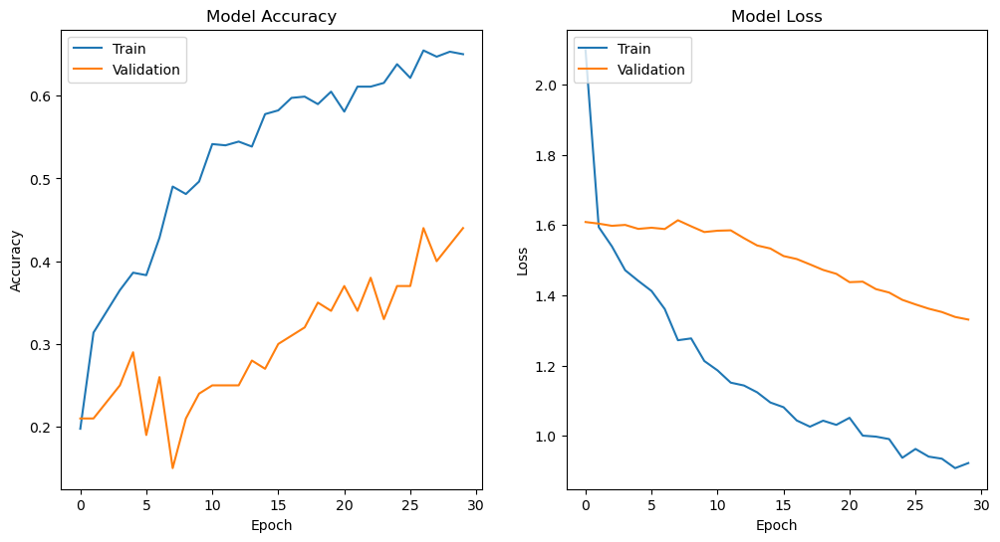

In [42]:
# Plotting the result of Model 4 :

plot_training_history(history)

So we have got the training accuarcy of 67 % and validation accuracy of 44 % in the fourth model

# Model 5 : Conv 3D model

## batch size 30, increased image inputs to 30, reduced parameters

In [43]:
batch_size = 30

In [44]:
def generator(source_path, folder_list, batch_size):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    
    #create a list of image numbers you want to use for a particular video
    img_idx = [x for x in range(0, 30)] 
    #list(range(0,29,2))
    
    while True:
        t = np.random.permutation(folder_list)
        
# calculate the number of batches
        num_batches = int(len(t)/batch_size)
        
# we iterate over the number of batches
        for batch in range(num_batches): 
            
# x is the number of images you use for each video, (y,z) is the final size of the input images and 3 is the number of channels RGB          
            batch_data = np.zeros((batch_size,30,84,84,3))
# batch_labels is the one hot representation of the output
            batch_labels = np.zeros((batch_size,5))

# iterate over the batch_size    
            for folder in range(batch_size): 
# read all the images in the folder        
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) 
#  Iterate over the frames/images of a folder to read them in    
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    
#crop the images and resize them. Note that the images are of 2 different shape 
#and the conv3D will throw error if the inputs in a batch have different shapes
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(84,84),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(84,84),interpolation = cv2.INTER_AREA).astype(np.float32)
                                
#normalise and feed in the image

                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
#you yield the batch_data and the batch_labels, remember what does yield do                
            yield batch_data, batch_labels 

        
# write the code for the remaining data points which are left after full batches
        if (len(t)%batch_size) != 0:
            batch_data = np.zeros((len(t)%batch_size,30,84,84,3))
            batch_labels = np.zeros((len(t)%batch_size,5))
            for folder in range(len(t)%batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (num_batches*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (num_batches*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(84,84),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(84,84),interpolation = cv2.INTER_AREA).astype(np.float32)

                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255

                batch_labels[folder, int(t[folder + (num_batches*batch_size)].strip().split(';')[2])] = 1

            yield batch_data, batch_labels

In [45]:
curr_dt_time = datetime.datetime.now()
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
# choose the number of epochs
num_epochs = 30
print ('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 30


In [46]:
# Define the 3D Convolutional Neural Network (Conv3D Model) - Updated Version
modelConv3D_5 = Sequential()

# First Conv3D layer
modelConv3D_5.add(Conv3D(8, 
                 kernel_size=(3, 3, 3), 
                 input_shape=(30, 84, 84, 3), 
                 padding='same'))
modelConv3D_5.add(BatchNormalization())
modelConv3D_5.add(Activation('relu'))
modelConv3D_5.add(MaxPooling3D(pool_size=(2, 2, 2)))

# Second Conv3D layer
modelConv3D_5.add(Conv3D(16, 
                 kernel_size=(3, 3, 3), 
                 padding='same'))
modelConv3D_5.add(BatchNormalization())
modelConv3D_5.add(Activation('relu'))
modelConv3D_5.add(MaxPooling3D(pool_size=(2, 2, 2)))

# Third Conv3D layer
modelConv3D_5.add(Conv3D(32, 
                 kernel_size=(3, 3, 3), 
                 padding='same'))
modelConv3D_5.add(BatchNormalization())
modelConv3D_5.add(Activation('relu'))
modelConv3D_5.add(MaxPooling3D(pool_size=(2, 2, 2)))

# Fourth Conv3D layer
modelConv3D_5.add(Conv3D(64, 
                 kernel_size=(3, 3, 3), 
                 padding='same'))
modelConv3D_5.add(BatchNormalization())
modelConv3D_5.add(Activation('relu'))
modelConv3D_5.add(MaxPooling3D(pool_size=(2, 2, 2)))

# Flatten the 3D outputs to feed into the dense layers
modelConv3D_5.add(Flatten())

# Fully connected dense layers
modelConv3D_5.add(Dense(64, activation='relu'))
modelConv3D_5.add(BatchNormalization())
modelConv3D_5.add(Dropout(0.25))

modelConv3D_5.add(Dense(64, activation='relu'))
modelConv3D_5.add(BatchNormalization())
modelConv3D_5.add(Dropout(0.25))

# Output layer with softmax activation for multi-class classification
modelConv3D_5.add(Dense(5, activation='softmax'))

# Define the optimizer (Updated to latest Adam API)
optimiser = Adam(learning_rate=0.0003)

# Compile the model
modelConv3D_5.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
print(modelConv3D_5.summary())

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv3d_16 (Conv3D)                   │ (None, 30, 84, 84, 8)       │             656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_21               │ (None, 30, 84, 84, 8)       │              32 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_16 (Activation)           │ (None, 30, 84, 84, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_16 (MaxPooling3D)      │ (None, 15, 42, 42, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_17 (Conv3D)                   │ (None, 15, 42, 42, 16)      │           3,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_22               │ (None, 15, 42, 42, 16)      │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_17 (Activation)           │ (None, 15, 42, 42, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_17 (MaxPooling3D)      │ (None, 7, 21, 21, 16)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_18 (Conv3D)                   │ (None, 7, 21, 21, 32)       │          13,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 7, 21, 21, 32)       │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_18 (Activation)           │ (None, 7, 21, 21, 32)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_18 (MaxPooling3D)      │ (None, 3, 10, 10, 32)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_19 (Conv3D)                   │ (None, 3, 10, 10, 64)       │          55,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 3, 10, 10, 64)       │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_19 (Activation)           │ (None, 3, 10, 10, 64)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_19 (MaxPooling3D)      │ (None, 1, 5, 5, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 1600)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 64)                  │         102,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_25               │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │              

 Total params: 181,285 (708.14 KB)

 Trainable params: 180,789 (706.21 KB)

 Non-trainable params: 496 (1.94 KB)

None


In [47]:
print("Total Params in model:", modelConv3D_5.count_params())

Total Params in model: 181285


In [48]:
# Create data generators for training and validation
train_generator = generator(train_path, train_doc, batch_size)
val_generator = generator(val_path, val_doc, batch_size)

# Define the directory where the model checkpoints will be saved
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ', '').replace(':', '_') + '/'

# Create the directory if it does not exist
if not os.path.exists(model_name):
    os.mkdir(model_name)

# Define the file path for saving model checkpoints
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Setup ModelCheckpoint to save the model
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto')

# Setup ReduceLROnPlateau to adjust learning rate on plateaus
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4, verbose=1)

# Combine callbacks into a list
callbacks_list = [checkpoint, LR]

# Calculate steps per epoch for training data
steps_per_epoch = (num_train_sequences + batch_size - 1) // batch_size

# Calculate steps per epoch for validation data
validation_steps = (num_val_sequences + batch_size - 1) // batch_size


In [49]:
# Train the model using fit with generators and multiprocessing to improve training time
history = modelConv3D_5.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)

Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\train ; batch size = 30
Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.2624 - loss: 1.9970Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\val ; batch size = 30

Epoch 1: saving model to model_init_2024-09-1222_24_18.308736/model-00001-1.78108-0.33032-1.62577-0.21000.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - categorical_accuracy: 0.2653 - loss: 1.9880 - val_categorical_accuracy: 0.2100 - val_loss: 1.6258 - learning_rate: 3.0000e-04
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.5267 - loss: 1.2449
Epoch 2: saving model to model_init_2024-09-1222_24_18.308736/model-00002-1.18161-0.53243-1.73035-0.21000.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 37s 2s/step - categorical_accuracy: 0.5269 - loss: 1.2423 - val_categorical_accuracy: 0.2100 - val_loss: 1.7303 - learning_rate: 3.0000e-04
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - categorical_accuracy: 0.6449 - loss: 0.8989

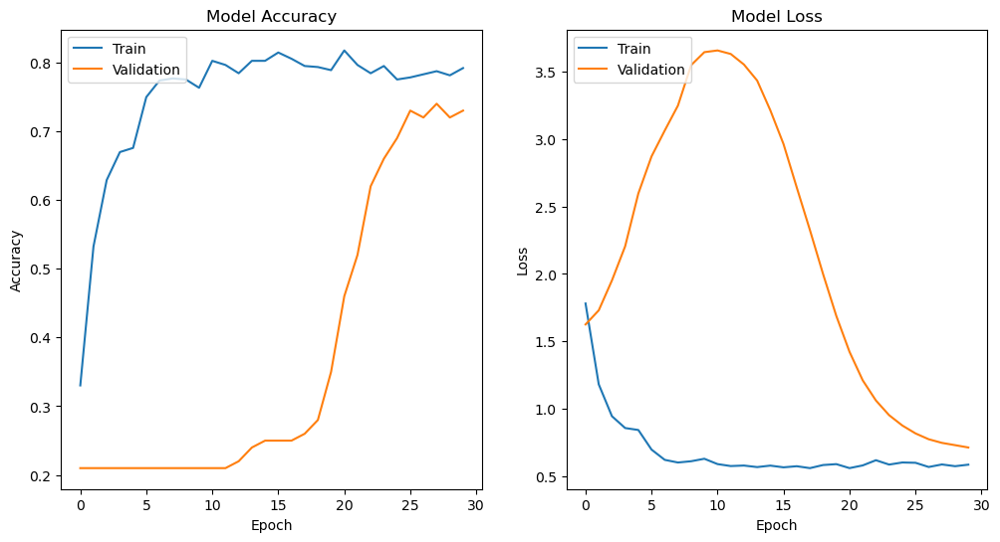

In [50]:
# Plotting the result of Model 5 :

plot_training_history(history)

We have achieved the best test accuracy of 80.67 % and validation accuracy of 73 % by the convolutional model.

### _We have tried multiple experiments with Conv 3D model but the performance of models are not as expected and is overfitting, so lets try with the other models for the same problem statement.

# Model 6 : CNN - LSTM Model 

In [51]:
# Input
input_shape=(30,120,120,3)

In [52]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import TimeDistributed, Conv2D, BatchNormalization, MaxPooling2D, Flatten, LSTM, Dropout, Dense, Input
from tensorflow.keras import optimizers

# Define the model
CNNlstm_1 = Sequential()

# TimeDistributed Conv2D and MaxPooling2D layers
CNNlstm_1.add(TimeDistributed(Conv2D(16, (3, 3), padding='same', activation='relu'),
                              input_shape=input_shape))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_1.add(TimeDistributed(Conv2D(32, (3, 3), padding='same', activation='relu')))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_1.add(TimeDistributed(Conv2D(64, (3, 3), padding='same', activation='relu')))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_1.add(TimeDistributed(Conv2D(128, (3, 3), padding='same', activation='relu')))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

CNNlstm_1.add(TimeDistributed(Conv2D(256, (3, 3), padding='same', activation='relu')))
CNNlstm_1.add(TimeDistributed(BatchNormalization()))
CNNlstm_1.add(TimeDistributed(MaxPooling2D((2, 2))))

# Flatten and LSTM layers
CNNlstm_1.add(TimeDistributed(Flatten()))
CNNlstm_1.add(LSTM(128, return_sequences=False))
CNNlstm_1.add(Dropout(0.25))

# Dense layers
CNNlstm_1.add(Dense(128, activation='relu'))
CNNlstm_1.add(Dropout(0.25))
CNNlstm_1.add(Dense(5, activation='softmax'))

# Define the optimizer
optimiser = optimizers.Adam(learning_rate=0.001)

# Compile the model
CNNlstm_1.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
print(CNNlstm_1.summary())


C:\Users\Sc0uRJaX\anaconda3\Lib\site-packages\keras\src\layers\core\wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed (TimeDistributed)   │ (None, 30, 120, 120, 16)    │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 30, 120, 120, 16)    │              64 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_2 (TimeDistributed) │ (None, 30, 60, 60, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_3 (TimeDistributed) │ (None, 30, 60, 60, 32)      │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_4 (TimeDistributed) │ (None, 30, 60, 60, 32)      │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_5 (TimeDistributed) │ (None, 30, 30, 30, 32)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_6 (TimeDistributed) │ (None, 30, 30, 30, 64)      │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_7 (TimeDistributed) │ (None, 30, 30, 30, 64)      │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_8 (TimeDistributed) │ (None, 30, 15, 15, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_9 (TimeDistributed) │ (None, 30, 15, 15, 128)     │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_10                  │ (None, 30, 15, 15, 128)     │             512 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_11                  │ (None, 30, 7, 7, 128)       │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_12                  │ (None, 30, 7, 7, 256)       │         295,168 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_13                  │ (None, 30, 7, 7, 256)       │           1,024 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_14                  │ (None, 30, 3, 3, 256)       │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_15                  │ (None, 30, 2304)            │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 128)                 │       1,245,696 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 1,657,445 (6.32 MB)

 Trainable params: 1,656,453 (6.32 MB)

 Non-trainable params: 992 (3.88 KB)

None


In [53]:
# Define batch size for training and validation
batch_size = 20

# Get the current date and time
curr_dt_time = datetime.datetime.now()

# Count the number of training and validation sequences
num_train_sequences = len(train_doc)  # Length of training document list
print('# training sequences =', num_train_sequences)

num_val_sequences = len(val_doc)  # Length of validation document list
print('# validation sequences =', num_val_sequences)

# Define the number of epochs for training
num_epochs = 20
print('# epochs =', num_epochs)



# training sequences = 663
# validation sequences = 100
# epochs = 20


In [54]:
def generatorLSTM(source_path, folder_list, batch_size):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    
    #create a list of image numbers you want to use for a particular video
    img_idx = [x for x in range(0, 30)]
    #list(range(0,29,2))
    
    while True:
        t = np.random.permutation(folder_list)
        
# calculate the number of batches
        num_batches = int(len(t)/batch_size)
        
# we iterate over the number of batches
        for batch in range(num_batches): 
            
# x is the number of images you use for each video, (y,z) is the final size of the input images and 3 is the number of channels RGB          
            batch_data = np.zeros((batch_size,30,120,120,3))
# batch_labels is the one hot representation of the output
            batch_labels = np.zeros((batch_size,5))

# iterate over the batch_size    
            for folder in range(batch_size): 
# read all the images in the folder        
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) 
#  Iterate over the frames/images of a folder to read them in    
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    
#crop the images and resize them. Note that the images are of 2 different shape 
#and the conv3D will throw error if the inputs in a batch have different shapes
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(120,120),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(120,120),interpolation = cv2.INTER_AREA).astype(np.float32)
                                
#normalise and feed in the image

                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
#you yield the batch_data and the batch_labels, remember what does yield do                
            yield batch_data, batch_labels 

        
# write the code for the remaining data points which are left after full batches
        if (len(t)%batch_size) != 0:
            batch_data = np.zeros((len(t)%batch_size,30,120,120,3))
            batch_labels = np.zeros((len(t)%batch_size,5))
            for folder in range(len(t)%batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (num_batches*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (num_batches*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(120,120),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(120,120),interpolation = cv2.INTER_AREA).astype(np.float32)

                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255

                batch_labels[folder, int(t[folder + (num_batches*batch_size)].strip().split(';')[2])] = 1

            yield batch_data, batch_labels

In [55]:
# Create data generators for training and validation
train_generator = generatorLSTM(train_path, train_doc, batch_size)
val_generator = generatorLSTM(val_path, val_doc, batch_size)

# Define the directory where model checkpoints will be saved
model_name = 'model_init_' + str(curr_dt_time).replace(' ', '').replace(':', '_') + '/'

# Create the directory if it does not exist
if not os.path.exists(model_name):
    os.mkdir(model_name)

# Define the file path for saving model checkpoints
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Set up ModelCheckpoint to save the model
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto')

# Set up ReduceLROnPlateau to adjust learning rate on plateaus
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4, verbose=1)

# Combine callbacks into a list
callbacks_list = [checkpoint, LR]

# Calculate steps per epoch and validation steps
steps_per_epoch = (num_train_sequences + batch_size - 1) // batch_size
validation_steps = (num_val_sequences + batch_size - 1) // batch_size

# Print calculated values for reference
print(f'Steps per epoch: {steps_per_epoch}')
print(f'Validation steps: {validation_steps}')


Steps per epoch: 34
Validation steps: 5


In [56]:
history = CNNlstm_1.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)


Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\train ; batch size = 20
Epoch 1/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - categorical_accuracy: 0.3247 - loss: 1.5083 Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\val ; batch size = 20

Epoch 1: saving model to model_init_2024-09-1222_43_23.045086/model-00001-1.41212-0.39668-1.10215-0.60000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 449s 12s/step - categorical_accuracy: 0.3267 - loss: 1.5056 - val_categorical_accuracy: 0.6000 - val_loss: 1.1021 - learning_rate: 0.0010
Epoch 2/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - categorical_accuracy: 0.5652 - loss: 1.0793 
Epoch 2: saving model to model_init_2024-09-1222_43_23.045086/model-00002-1.01957-0.61237-0.88062-0.63000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 402s 12s/step - categorical_accuracy: 0.5665 - loss: 1.0776 - val_categorical_accuracy: 0.6300 - val_loss: 0.8806 - learning_rate: 0.0010
Epoch 3/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - categorical_accuracy: 0.6780 - loss: 0.837

In [57]:
print("Total Params in model:", CNNlstm_1.count_params())

Total Params in model: 1657445


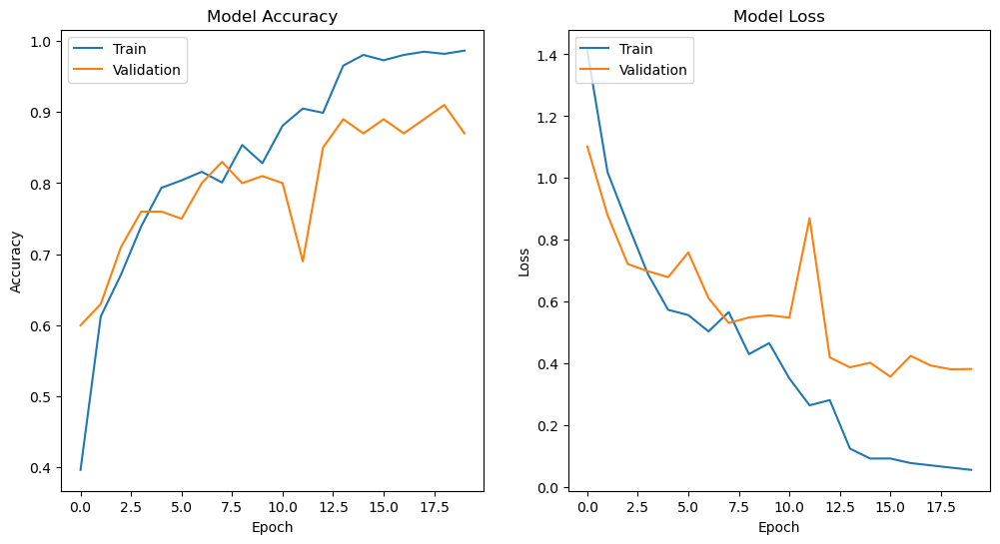

In [58]:
# Plotting the result of Model 6 :

plot_training_history(history)

Best test accuracy of 98.52 % and validation accuracy of 87 % with this model.

# Model 7 : CNN - LSTM Model, Increase network paramaters

In [65]:
# Define the input shape
input_shape = (30, 120, 120, 3)

# Initialize the Sequential model
CNNlstm_4 = Sequential()

# Add 3D convolutional layers with BatchNormalization and ReLU activation
CNNlstm_4.add(Conv3D(16, (3, 3, 3), padding='same', input_shape=input_shape))
CNNlstm_4.add(Activation('relu'))
CNNlstm_4.add(BatchNormalization())

CNNlstm_4.add(Conv3D(16, (3, 3, 3), padding='same'))
CNNlstm_4.add(Activation('relu'))
CNNlstm_4.add(BatchNormalization())

CNNlstm_4.add(MaxPooling3D(pool_size=(2, 2, 2)))

CNNlstm_4.add(Conv3D(32, (3, 3, 3), padding='same'))
CNNlstm_4.add(Activation('relu'))
CNNlstm_4.add(BatchNormalization())

CNNlstm_4.add(Conv3D(32, (3, 3, 3), padding='same'))
CNNlstm_4.add(Activation('relu'))
CNNlstm_4.add(BatchNormalization())

CNNlstm_4.add(MaxPooling3D(pool_size=(2, 2, 2)))

CNNlstm_4.add(Conv3D(64, (3, 3, 3), padding='same'))
CNNlstm_4.add(Activation('relu'))
CNNlstm_4.add(BatchNormalization())

CNNlstm_4.add(Conv3D(64, (3, 3, 3), padding='same'))
CNNlstm_4.add(Activation('relu'))
CNNlstm_4.add(BatchNormalization())

CNNlstm_4.add(MaxPooling3D(pool_size=(2, 2, 2)))

CNNlstm_4.add(Conv3D(128, (3, 3, 3), padding='same'))
CNNlstm_4.add(Activation('relu'))
CNNlstm_4.add(BatchNormalization())

CNNlstm_4.add(Conv3D(128, (3, 3, 3), padding='same'))
CNNlstm_4.add(Activation('relu'))
CNNlstm_4.add(BatchNormalization())

CNNlstm_4.add(MaxPooling3D(pool_size=(2, 2, 2)))

# Flatten the output and add Dense layers with Dropout
CNNlstm_4.add(Flatten())
CNNlstm_4.add(Dense(128, activation='relu'))
CNNlstm_4.add(BatchNormalization())
CNNlstm_4.add(Dropout(0.25))

CNNlstm_4.add(Dense(128, activation='relu'))
CNNlstm_4.add(BatchNormalization())
CNNlstm_4.add(Dropout(0.25))

# Output layer with softmax activation for classification
CNNlstm_4.add(Dense(5, activation='softmax'))

# Define the optimizer
optimiser = optimizers.Adam()

# Compile the model
CNNlstm_4.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
print(CNNlstm_4.summary())

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv3d_20 (Conv3D)                   │ (None, 30, 120, 120, 16)    │           1,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_20 (Activation)           │ (None, 30, 120, 120, 16)    │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_37               │ (None, 30, 120, 120, 16)    │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_21 (Conv3D)                   │ (None, 30, 120, 120, 16)    │           6,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_21 (Activation)           │ (None, 30, 120, 120, 16)    │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_38               │ (None, 30, 120, 120, 16)    │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_20 (MaxPooling3D)      │ (None, 15, 60, 60, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_22 (Conv3D)                   │ (None, 15, 60, 60, 32)      │          13,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_22 (Activation)           │ (None, 15, 60, 60, 32)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_39               │ (None, 15, 60, 60, 32)      │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_23 (Conv3D)                   │ (None, 15, 60, 60, 32)      │          27,680 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_23 (Activation)           │ (None, 15, 60, 60, 32)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_40               │ (None, 15, 60, 60, 32)      │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_21 (MaxPooling3D)      │ (None, 7, 30, 30, 32)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_24 (Conv3D)                   │ (None, 7, 30, 30, 64)       │          55,360 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_24 (Activation)           │ (None, 7, 30, 30, 64)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_41               │ (None, 7, 30, 30, 64)       │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3d_25 (Conv3D)                   │ (None, 7, 30, 30, 64)       │         110,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_25 (Activation)           │ (None, 7, 30, 30, 64)       │              

 Total params: 1,702,645 (6.50 MB)

 Trainable params: 1,701,173 (6.49 MB)

 Non-trainable params: 1,472 (5.75 KB)

None


In [66]:
print("Total Params in model:", CNNlstm_4.count_params())

Total Params in model: 1702645


In [67]:
batch_size = 20
curr_dt_time = datetime.datetime.now()
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
# choose the number of epochs
num_epochs = 25
print ('# epochs =', num_epochs)


# training sequences = 663
# validation sequences = 100
# epochs = 25


In [71]:
# Ensure the datetime module is correctly imported at the beginning of your script
from datetime import datetime

# Define the model (as per your previous code)

# Setup the training and validation generators
train_generator = generatorLSTM(train_path, train_doc, batch_size)
val_generator = generatorLSTM(val_path, val_doc, batch_size)

# Create a unique directory name for saving the model based on current date and time
curr_dt_time = datetime.now()  # This will work correctly with the correct import
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ', '').replace(':', '_') + '/'

# Check if the directory exists; if not, create it
if not os.path.exists(model_name):
    os.mkdir(model_name)

# Define the filepath for saving the model
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Define a ModelCheckpoint to save the model after every epoch
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto')

# Define a ReduceLROnPlateau callback to reduce learning rate when validation loss plateaus
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4)

# Combine callbacks into a list for use during model training
callbacks_list = [checkpoint, LR]

# Calculate the number of steps per epoch for training
if (num_train_sequences % batch_size) == 0:
    steps_per_epoch = int(num_train_sequences / batch_size)
else:
    steps_per_epoch = (num_train_sequences // batch_size) + 1

# Calculate the number of validation steps per epoch
if (num_val_sequences % batch_size) == 0:
    validation_steps = int(num_val_sequences / batch_size)
else:
    validation_steps = (num_val_sequences // batch_size) + 1


In [73]:
# Train the model using fit with generators and multiprocessing to improve training time
history = CNNlstm_4.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)

Epoch 1/25
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - categorical_accuracy: 0.9774 - loss: 0.1037
Epoch 1: saving model to model_init_2024-09-1301_53_04.092657/model-00001-0.09442-0.97888-0.18701-0.93000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 226s 7s/step - categorical_accuracy: 0.9774 - loss: 0.1034 - val_categorical_accuracy: 0.9300 - val_loss: 0.1870 - learning_rate: 4.0000e-05
Epoch 2/25
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - categorical_accuracy: 0.9919 - loss: 0.0740
Epoch 2: saving model to model_init_2024-09-1301_53_04.092657/model-00002-0.09388-0.98492-0.23480-0.92000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 222s 7s/step - categorical_accuracy: 0.9917 - loss: 0.0746 - val_categorical_accuracy: 0.9200 - val_loss: 0.2348 - learning_rate: 4.0000e-05
Epoch 3/25
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - categorical_accuracy: 0.9710 - loss: 0.0963
Epoch 3: saving model to model_init_2024-09-1301_53_04.092657/model-00003-0.10433-0.97436-0.20268-0.95000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 221s 6s/step - c

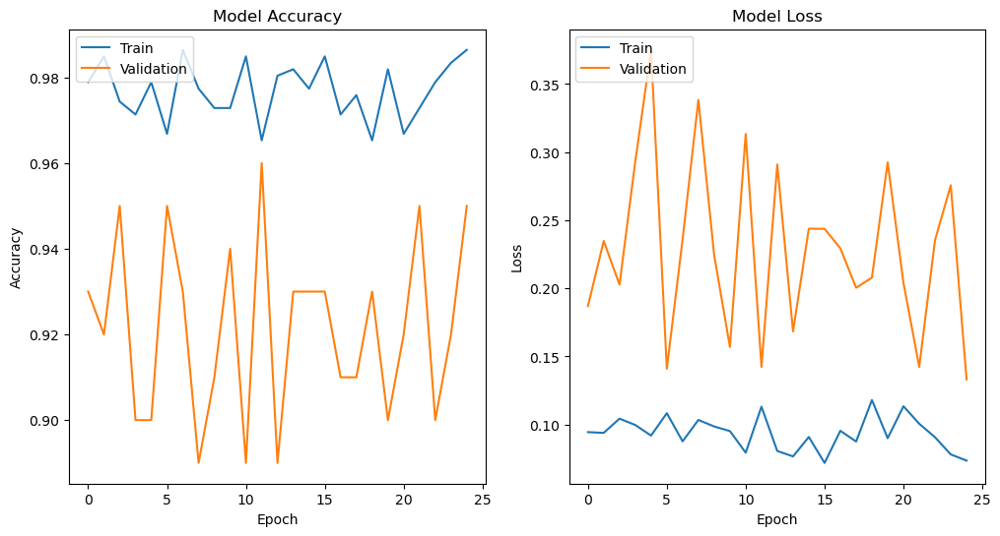

In [74]:
# Plotting the result of Model 7 :

plot_training_history(history)

Got best test accuracy of 99.10 % and validation accuracy of 95 % 

# Model 8 : CNN LSTM with GRU

In [76]:
# Define the input shape
input_shape = (30, 120, 120, 3)

# Initialize the Sequential model
GRU_lstm = Sequential()

# Add TimeDistributed Conv2D layers with BatchNormalization and ReLU activation
GRU_lstm.add(TimeDistributed(Conv2D(16, (3, 3), padding='same', activation='relu'),
                             input_shape=input_shape))
GRU_lstm.add(TimeDistributed(BatchNormalization()))
GRU_lstm.add(TimeDistributed(MaxPooling2D((2, 2))))

GRU_lstm.add(TimeDistributed(Conv2D(32, (3, 3), padding='same', activation='relu')))
GRU_lstm.add(TimeDistributed(BatchNormalization()))
GRU_lstm.add(TimeDistributed(MaxPooling2D((2, 2))))

GRU_lstm.add(TimeDistributed(Conv2D(64, (3, 3), padding='same', activation='relu')))
GRU_lstm.add(TimeDistributed(BatchNormalization()))
GRU_lstm.add(TimeDistributed(MaxPooling2D((2, 2))))

GRU_lstm.add(TimeDistributed(Conv2D(128, (3, 3), padding='same', activation='relu')))
GRU_lstm.add(TimeDistributed(BatchNormalization()))
GRU_lstm.add(TimeDistributed(MaxPooling2D((2, 2))))

# Flatten the output before passing to GRU
GRU_lstm.add(TimeDistributed(Flatten()))

# Add GRU layer followed by Dropout
GRU_lstm.add(GRU(128))
GRU_lstm.add(Dropout(0.25))

# Dense layers with ReLU activation and Dropout
GRU_lstm.add(Dense(128, activation='relu'))
GRU_lstm.add(Dropout(0.25))

# Output layer with softmax activation for classification
GRU_lstm.add(Dense(5, activation='softmax'))

# Define the optimizer
optimiser = optimizers.Adam()

# Compile the model
GRU_lstm.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
print(GRU_lstm.summary())

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed_32                  │ (None, 30, 120, 120, 16)    │             448 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_33                  │ (None, 30, 120, 120, 16)    │              64 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_34                  │ (None, 30, 60, 60, 16)      │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_35                  │ (None, 30, 60, 60, 32)      │           4,640 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_36                  │ (None, 30, 60, 60, 32)      │             128 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_37                  │ (None, 30, 30, 30, 32)      │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_38                  │ (None, 30, 30, 30, 64)      │          18,496 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_39                  │ (None, 30, 30, 30, 64)      │             256 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_40                  │ (None, 30, 15, 15, 64)      │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_41                  │ (None, 30, 15, 15, 128)     │          73,856 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_42                  │ (None, 30, 15, 15, 128)     │             512 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_43                  │ (None, 30, 7, 7, 128)       │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_44                  │ (None, 30, 6272)            │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru (GRU)                            │ (None, 128)                 │       2,458,368 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 128)                 │              

 Total params: 2,573,925 (9.82 MB)

 Trainable params: 2,573,445 (9.82 MB)

 Non-trainable params: 480 (1.88 KB)

None


In [77]:
print("Total Params in model:", GRU_lstm.count_params())

Total Params in model: 2573925


In [81]:
# Ensure the datetime module is correctly imported at the beginning of your script
from datetime import datetime

batch_size = 20
curr_dt_time = datetime.now()  # Use datetime.now() since we've imported datetime directly
train_path = r'C:\Users\Sc0uRJaX\Downloads\Project_data\train'
val_path = r'C:\Users\Sc0uRJaX\Downloads\Project_data\val'
num_train_sequences = len(train_doc)
print('# training sequences =', num_train_sequences)
num_val_sequences = len(val_doc)
print('# validation sequences =', num_val_sequences)
# Choose the number of epochs
num_epochs = 20
print('# epochs =', num_epochs)



# training sequences = 663
# validation sequences = 100
# epochs = 20


In [84]:
# Initialize the generators for training and validation data
train_generator = generatorLSTM(train_path, train_doc, batch_size)
val_generator = generatorLSTM(val_path, val_doc, batch_size)

model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ', '').replace(':', '_') + '/'

# Create a directory for saving the model if it doesn't already exist
if not os.path.exists(model_name):
    os.mkdir(model_name)

# Define the filepath to save the model at each epoch
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Set up a ModelCheckpoint callback to save the model after each epoch
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, 
                             save_best_only=False, save_weights_only=False, mode='auto', save_freq='epoch')

# ReduceLROnPlateau callback to reduce learning rate when validation loss plateaus
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4)

# List of callbacks to be used during training
callbacks_list = [checkpoint, LR]

# Calculate the number of steps per epoch based on the number of training sequences
if (num_train_sequences % batch_size) == 0:
    steps_per_epoch = int(num_train_sequences / batch_size)
else:
    steps_per_epoch = (num_train_sequences // batch_size) + 1

# Calculate the number of validation steps based on the number of validation sequences
if (num_val_sequences % batch_size) == 0:
    validation_steps = int(num_val_sequences / batch_size)
else:
    validation_steps = (num_val_sequences // batch_size) + 1


In [85]:
# Train the model using fit with generators and multiprocessing to improve training time
history = GRU_lstm.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)

Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\train ; batch size = 20
Epoch 1/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - categorical_accuracy: 0.3394 - loss: 1.6169 Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\val ; batch size = 20

Epoch 1: saving model to model_init_2024-09-1305_22_46.219023/model-00001-1.42497-0.41478-0.99632-0.61000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 436s 12s/step - categorical_accuracy: 0.3416 - loss: 1.6114 - val_categorical_accuracy: 0.6100 - val_loss: 0.9963 - learning_rate: 0.0010
Epoch 2/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - categorical_accuracy: 0.6029 - loss: 0.9841 
Epoch 2: saving model to model_init_2024-09-1305_22_46.219023/model-00002-0.96068-0.61538-0.83732-0.70000.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 391s 11s/step - categorical_accuracy: 0.6032 - loss: 0.9834 - val_categorical_accuracy: 0.7000 - val_loss: 0.8373 - learning_rate: 0.0010
Epoch 3/20
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - categorical_accuracy: 0.7319 - loss: 0.818

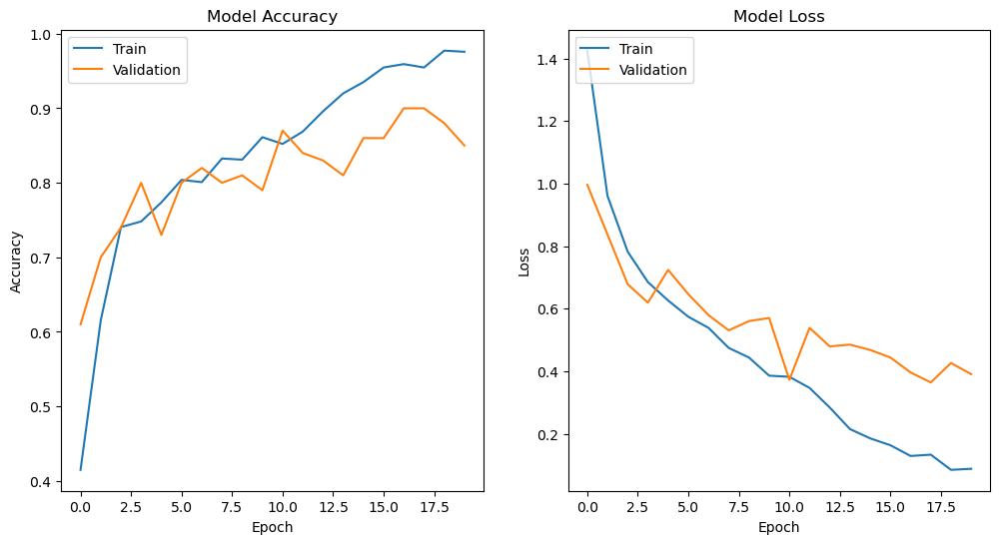

In [94]:
# Plotting the result of Model 8 :

plot_training_history(history)

We have got best test accuracy of 96.67 % and val accuracy of 85 %

### Lets use the pre-trained model for the transfer learning.

# Model 9: Model with Transfer Learning

In [96]:
# Importing the transfer learning model:
from keras.applications import mobilenet

mobilenet_transfer = mobilenet.MobileNet(weights='imagenet', include_top=False)

C:\Users\Sc0uRJaX\AppData\Local\Temp\ipykernel_16556\4291270708.py:4: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet_transfer = mobilenet.MobileNet(weights='imagenet', include_top=False)


In [97]:
# MobileNet V2 model accepts one of the following formats: (96, 96), (128, 128), (160, 160),(192, 192), or (224, 224).
# Hence, we have got this warning for the input as we have not specified the input size while import.

In [98]:
# Import necessary libraries
from keras.applications import mobilenet
from keras.layers import TimeDistributed, LSTM, Dense, Dropout, BatchNormalization, MaxPooling2D, Flatten
from keras.models import Sequential
from keras import optimizers

# Load MobileNet without the top layer (for feature extraction)
mobilenet_transfer = mobilenet.MobileNet(weights='imagenet', include_top=False, input_shape=(120, 120, 3))

# Build the model
input_shape = (18, 120, 120, 3)  # 18 time steps, 120x120 image, 3 channels (RGB)

mobileNetModel = Sequential()

# Use TimeDistributed to wrap MobileNet
mobileNetModel.add(TimeDistributed(mobilenet_transfer, input_shape=input_shape))

# Freeze MobileNet layers to avoid training them
for layer in mobilenet_transfer.layers:
    layer.trainable = False

# Add additional layers
mobileNetModel.add(TimeDistributed(BatchNormalization()))
mobileNetModel.add(TimeDistributed(MaxPooling2D((2, 2))))
mobileNetModel.add(TimeDistributed(Flatten()))

# Add LSTM layer
mobileNetModel.add(LSTM(128))
mobileNetModel.add(Dropout(0.25))

# Add Dense layers
mobileNetModel.add(Dense(128, activation='relu'))
mobileNetModel.add(Dropout(0.25))

# Output layer for classification (assuming 5 classes)
mobileNetModel.add(Dense(5, activation='softmax'))

# Compile the model
optimiser = optimizers.Adam()
mobileNetModel.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
print(mobileNetModel.summary())

C:\Users\Sc0uRJaX\AppData\Local\Temp\ipykernel_16556\3509761874.py:8: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet_transfer = mobilenet.MobileNet(weights='imagenet', include_top=False, input_shape=(120, 120, 3))


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed_49                  │ (None, 18, 3, 3, 1024)      │       3,228,864 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_50                  │ (None, 18, 3, 3, 1024)      │           4,096 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_51                  │ (None, 18, 1, 1, 1024)      │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_52                  │ (None, 18, 1024)            │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 128)                 │         590,336 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_21 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_22 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,840,453 (14.65 MB)

 Trainable params: 609,541 (2.33 MB)

 Non-trainable params: 3,230,912 (12.32 MB)

None


In [99]:
print("Total Params in model:", mobileNetModel.count_params())

Total Params in model: 3840453


In [100]:
def generatorMobileNet(source_path, folder_list, batch_size):
    print( 'Source path = ', source_path, '; batch size =', batch_size)
    
    #create a list of image numbers you want to use for a particular video
    img_idx = [1,2,4,6,7,8,10,12,14,16,18,20,21,22,24,26,27,29]
    #list(range(0,29,2))
    
    while True:
        t = np.random.permutation(folder_list)
        
# calculate the number of batches
        num_batches = int(len(t)/batch_size)
        
# we iterate over the number of batches
        for batch in range(num_batches): 
            
# x is the number of images you use for each video, (y,z) is the final size of the input images and 3 is the number of channels RGB          
            batch_data = np.zeros((batch_size,18,120,120,3))
# batch_labels is the one hot representation of the output
            batch_labels = np.zeros((batch_size,5))

# iterate over the batch_size    
            for folder in range(batch_size): 
# read all the images in the folder        
                imgs = os.listdir(source_path+'/'+ t[folder + (batch*batch_size)].split(';')[0]) 
#  Iterate over the frames/images of a folder to read them in    
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    
#crop the images and resize them. Note that the images are of 2 different shape 
#and the conv3D will throw error if the inputs in a batch have different shapes
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(120,120),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(120,120),interpolation = cv2.INTER_AREA).astype(np.float32)
                                
#normalise and feed in the image

                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255
                    
                batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
#you yield the batch_data and the batch_labels, remember what does yield do                
            yield batch_data, batch_labels 

        
# write the code for the remaining data points which are left after full batches
        if (len(t)%batch_size) != 0:
            batch_data = np.zeros((len(t)%batch_size,18,120,120,3))
            batch_labels = np.zeros((len(t)%batch_size,5))
            for folder in range(len(t)%batch_size):
                imgs = os.listdir(source_path+'/'+ t[folder + (num_batches*batch_size)].split(';')[0])
                for idx,item in enumerate(img_idx):
                    image = cv2.imread(source_path+'/'+ t[folder + (num_batches*batch_size)].strip().split(';')[0]+'/'+imgs[item],cv2.IMREAD_UNCHANGED).astype(np.float32)
                    if image.shape[1] == 160:
                        image = cv2.resize(image[:,20:140,:],(120,120),interpolation = cv2.INTER_AREA).astype(np.float32)
                    else:
                        image = cv2.resize(image,(120,120),interpolation = cv2.INTER_AREA).astype(np.float32)

                    batch_data[folder,idx,:,:,0] = (image[:,:,0])/255
                    batch_data[folder,idx,:,:,1] = (image[:,:,1])/255
                    batch_data[folder,idx,:,:,2] = (image[:,:,2])/255

                batch_labels[folder, int(t[folder + (num_batches*batch_size)].strip().split(';')[2])] = 1

            yield batch_data, batch_labels

In [101]:
from datetime import datetime

# Define batch size and number of epochs
batch_size = 5
num_epochs = 20

# Get current date and time for unique model directory name
curr_dt_time = datetime.now()

# Paths to training and validation data
train_path = r'C:\Users\Sc0uRJaX\Downloads\Project_data\train'
val_path = r'C:\Users\Sc0uRJaX\Downloads\Project_data\val'

# Calculate the number of training and validation sequences
num_train_sequences = len(train_doc)
num_val_sequences = len(val_doc)

# Print information about the data and training
print('# training sequences =', num_train_sequences)
print('# validation sequences =', num_val_sequences)
print('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 20


In [102]:
from datetime import datetime
import os
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

# Generator for MobileNet training and validation data
train_generator = generatorMobileNet(train_path, train_doc, batch_size)
val_generator = generatorMobileNet(val_path, val_doc, batch_size)

# Creating a unique directory name for storing model files with current date and time
curr_dt_time = datetime.now()  # Ensure curr_dt_time is defined
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ', '').replace(':', '_') + '/'

# Check if the model directory exists, if not, create it
if not os.path.exists(model_name):
    os.mkdir(model_name)

# Defining the format for saving model checkpoints with epoch, loss, and accuracy in the filename
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Callback to save the model after every epoch based on validation loss (without overwriting previous models)
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', save_freq='epoch')

# Callback to reduce the learning rate when the validation loss plateaus (stops improving)
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4)

# List of callbacks to be passed during model training
callbacks_list = [checkpoint, LR]

# Calculate steps per epoch for training (how many batches to process in each epoch)
if (num_train_sequences % batch_size) == 0:
    steps_per_epoch = int(num_train_sequences / batch_size)
else:
    steps_per_epoch = (num_train_sequences // batch_size) + 1

# Calculate validation steps (how many batches to process in validation)
if (num_val_sequences % batch_size) == 0:
    validation_steps = int(num_val_sequences / batch_size)
else:
    validation_steps = (num_val_sequences // batch_size) + 1

In [103]:
# Train the model using fit with generators and multiprocessing to improve training time
history = mobileNetModel.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)

Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\train ; batch size = 5
Epoch 1/20
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - categorical_accuracy: 0.3980 - loss: 1.4638Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\val ; batch size = 5

Epoch 1: saving model to model_init_2024-09-1307_35_08.891968/model-00001-1.29953-0.49020-0.86387-0.65000.keras
133/133 ━━━━━━━━━━━━━━━━━━━━ 88s 407ms/step - categorical_accuracy: 0.3987 - loss: 1.4625 - val_categorical_accuracy: 0.6500 - val_loss: 0.8639 - learning_rate: 0.0010
Epoch 2/20
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - categorical_accuracy: 0.6638 - loss: 0.8444
Epoch 2: saving model to model_init_2024-09-1307_35_08.891968/model-00002-0.77669-0.70136-0.58847-0.79000.keras
133/133 ━━━━━━━━━━━━━━━━━━━━ 45s 336ms/step - categorical_accuracy: 0.6641 - loss: 0.8438 - val_categorical_accuracy: 0.7900 - val_loss: 0.5885 - learning_rate: 0.0010
Epoch 3/20
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step - categorical_accuracy: 0.7936

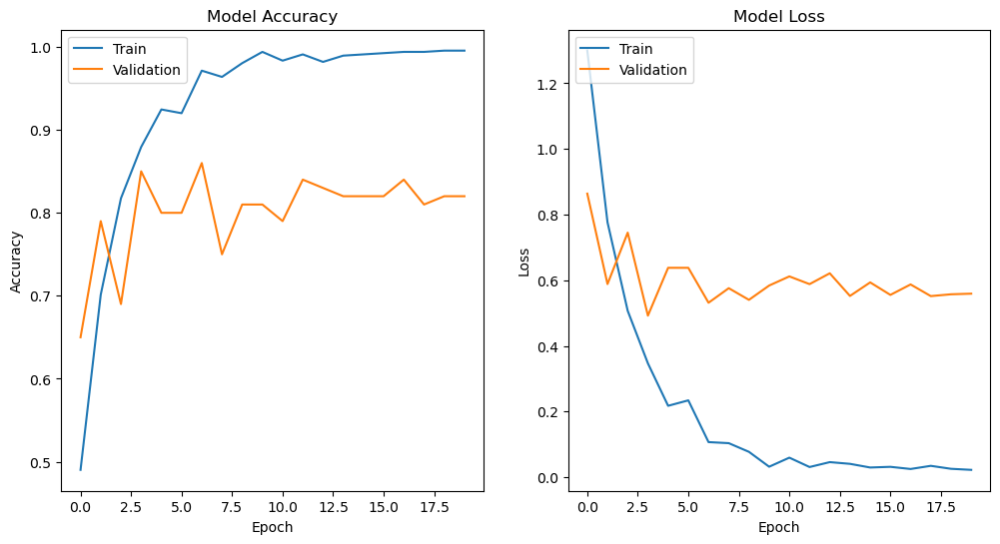

In [104]:
# Plotting the result of Model 9:

plot_training_history(history)

Best test accuracy of 99.09 % and val accuracy of 82 %.

We are not training the mobilenet weights and we see validation accuracy is very poor. Let's train them as well and observe if there is performance improvement.

# Model 10: Transfer Learning with GRU and training all weights

In [105]:
from keras.applications import mobilenet
from keras.models import Sequential
from keras.layers import TimeDistributed, BatchNormalization, MaxPooling2D, Flatten, GRU, Dropout, Dense
from tensorflow.keras import optimizers

# Import MobileNet without the top classification layers (i.e., the final Dense layers)
mobilenet_transfer = mobilenet.MobileNet(weights='imagenet', include_top=False)

# Define the input shape for the TimeDistributed layer
input_shape = (18, 120, 120, 3)

# Initialize the Sequential model
mobileNetModelWeight = Sequential()

# Add MobileNet as a TimeDistributed layer to handle sequences of images
mobileNetModelWeight.add(TimeDistributed(mobilenet_transfer, input_shape=input_shape))

# Add BatchNormalization, MaxPooling, and Flatten layers
mobileNetModelWeight.add(TimeDistributed(BatchNormalization()))
mobileNetModelWeight.add(TimeDistributed(MaxPooling2D((2, 2))))
mobileNetModelWeight.add(TimeDistributed(Flatten()))

# Add GRU layer and Dense layers with Dropout
mobileNetModelWeight.add(GRU(128))
mobileNetModelWeight.add(Dropout(0.25))

mobileNetModelWeight.add(Dense(128, activation='relu'))
mobileNetModelWeight.add(Dropout(0.25))

mobileNetModelWeight.add(Dense(5, activation='softmax'))

# Define the optimizer
optimiser = optimizers.Adam()

# Compile the model
mobileNetModelWeight.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Print the model summary
print(mobileNetModelWeight.summary())

C:\Users\Sc0uRJaX\AppData\Local\Temp\ipykernel_16556\4128231882.py:7: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet_transfer = mobilenet.MobileNet(weights='imagenet', include_top=False)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed_53                  │ (None, 18, 3, 3, 1024)      │       3,228,864 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_54                  │ (None, 18, 3, 3, 1024)      │           4,096 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_55                  │ (None, 18, 1, 1, 1024)      │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_56                  │ (None, 18, 1024)            │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_1 (GRU)                          │ (None, 128)                 │         443,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_23 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_24 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,693,253 (14.09 MB)

 Trainable params: 3,669,317 (14.00 MB)

 Non-trainable params: 23,936 (93.50 KB)

None


In [106]:
print("Total Params in model:", mobileNetModel.count_params())

Total Params in model: 3840453


In [107]:
from datetime import datetime

# Define batch size
batch_size = 5

# Get the current date and time for creating a unique directory
curr_dt_time = datetime.now()

# Define paths and sequences
train_path = r'C:\Users\Sc0uRJaX\Downloads\Project_data\train'
val_path = r'C:\Users\Sc0uRJaX\Downloads\Project_data\val'
num_train_sequences = len(train_doc)
num_val_sequences = len(val_doc)

# Print information about the data
print('# training sequences =', num_train_sequences)
print('# validation sequences =', num_val_sequences)

# Define the number of epochs
num_epochs = 20
print('# epochs =', num_epochs)

# training sequences = 663
# validation sequences = 100
# epochs = 20


In [108]:
# Create data generators for training and validation
train_generator = generatorMobileNet(train_path, train_doc, batch_size)
val_generator = generatorMobileNet(val_path, val_doc, batch_size)

# Define the model directory and create it if it doesn't exist
model_name = 'model_init' + '_' + str(curr_dt_time).replace(' ','').replace(':','_') + '/'
if not os.path.exists(model_name):
    os.mkdir(model_name)

# Define the filepath for saving model checkpoints
filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.keras'

# Define the checkpoint callback to save model weights
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', save_freq='epoch')

# Define the ReduceLROnPlateau callback to adjust learning rate when validation loss plateaus
LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4)

# List of callbacks to be used during training
callbacks_list = [checkpoint, LR]

# Calculate the number of steps per epoch
if (num_train_sequences % batch_size) == 0:
    steps_per_epoch = int(num_train_sequences / batch_size)
else:
    steps_per_epoch = (num_train_sequences // batch_size) + 1

# Calculate the number of validation steps
if (num_val_sequences % batch_size) == 0:
    validation_steps = int(num_val_sequences / batch_size)
else:
    validation_steps = (num_val_sequences // batch_size) + 1

In [109]:
# Train the model using fit with generators and multiprocessing to improve training time
history = mobileNetModel.fit(
    train_generator,                        # Training data generator
    steps_per_epoch=steps_per_epoch,        # Number of steps per epoch
    epochs=num_epochs,                      # Total number of epochs to train
    verbose=1,                              # Verbosity mode
    callbacks=callbacks_list,               # List of callbacks
    validation_data=val_generator,          # Validation data generator
    validation_steps=validation_steps,      # Number of validation steps
    class_weight=None,                      # Optional class weights
    initial_epoch=0                         # Epoch at which to start training
)

Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\train ; batch size = 5
Epoch 1/20
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step - categorical_accuracy: 0.9999 - loss: 0.0110Source path =  C:\Users\Sc0uRJaX\Downloads\Project_data\val ; batch size = 5

Epoch 1: saving model to model_init_2024-09-1307_50_11.070983/model-00001-0.01318-0.99849-0.60143-0.82000.keras
133/133 ━━━━━━━━━━━━━━━━━━━━ 45s 341ms/step - categorical_accuracy: 0.9999 - loss: 0.0110 - val_categorical_accuracy: 0.8200 - val_loss: 0.6014 - learning_rate: 1.6000e-06
Epoch 2/20
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step - categorical_accuracy: 0.9921 - loss: 0.0320
Epoch 2: saving model to model_init_2024-09-1307_50_11.070983/model-00002-0.02628-0.99397-0.57042-0.81000.keras
133/133 ━━━━━━━━━━━━━━━━━━━━ 44s 335ms/step - categorical_accuracy: 0.9921 - loss: 0.0319 - val_categorical_accuracy: 0.8100 - val_loss: 0.5704 - learning_rate: 1.6000e-06
Epoch 3/20
133/133 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step - categorical_accuracy

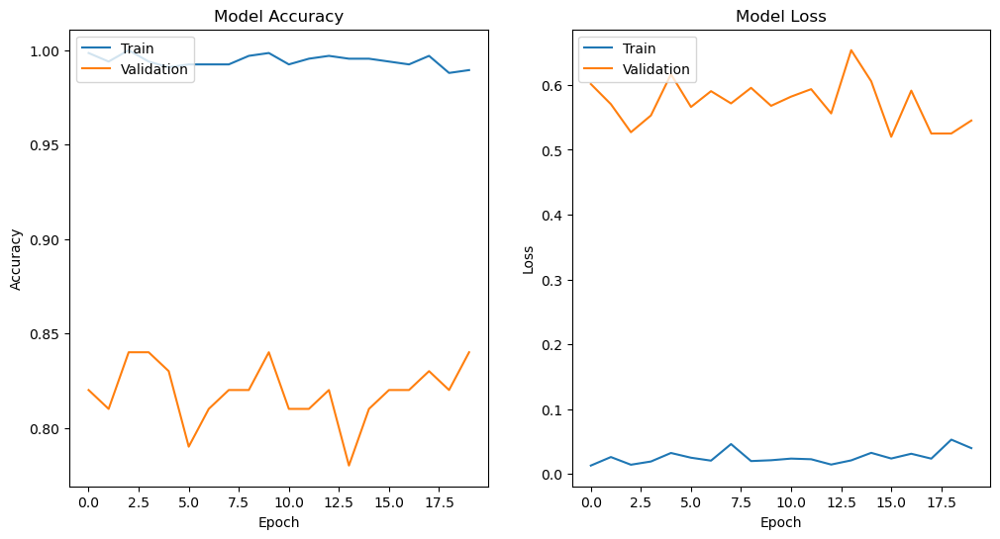

In [110]:
# Plotting the result of Model 10:

plot_training_history(history)

Got the best test accuracy of 98.58 % and val accuracy of 84 %.

## Final Model Choosen :

### Model 7 : CNN - LSTM Model, Increase network paramaters
#### model name "model_init_2024-09-1301_53_04.092657/model-00025-0.07352-0.98643-0.13312-0.95000.keras"
#### This has completed training in 5535 seconds (92.25 minutes) which is decent with test accuracy of 99.10 % and validation accuracy of 95 % 

### ***************************************** END OF CASE STUDY ********************************************